<a href="https://colab.research.google.com/github/RolloLaken/st_data/blob/main/deconvolution_redzuan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install panda
!pip install scanpy
!pip install matplotlib
!pip install scipy
!pip install deconomix

  Preparing metadata (setup.py) ... done
  Created wheel for panda: filename=panda-0.3.1-py3-none-any.whl size=7239 sha256=b639021fd998e53d9e7589caf22156cd10145ac10f095900e01c3b96d9178077
  Stored in directory: /root/.cache/pip/wheels/df/5c/39/36f8dae25a1e88d6ec4411dec4a143781e64fdff6897758eec
Successfully built panda
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.1/169.1 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.4/255.4 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/1

In [ ]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.colors import CenteredNorm
from scipy.stats import spearmanr
import deconomix
import deconomix as dx
import dask.dataframe as dd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Week 1**
**RESEARCH TOPIC:** Spatial transcriptomics datasets of healthy & IVH mouse brain after 7 days

To compare your IVH 7d vs. healthy top gene lists and focus on which genes to prioritize:

High variance/high expression in IVH but not in healthy (→ IVH-specific signals)

Or vice versa (→ healthy-specific)

Or shared genes that change expression/variance significantly (→ regulated under IVH)

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np

# Step 1: Load the AnnData objects
ivh_path = "/content/drive/MyDrive/Colab Notebooks/GSM6604495_IVH_7d_2_110_matrix_processed.h5ad"
ctrl_path = "/content/drive/MyDrive/Colab Notebooks/GSM6604497_IVH_C1_110_matrix_processed.h5ad"

adata_ivh = sc.read_h5ad(ivh_path)
adata_ctrl = sc.read_h5ad(ctrl_path)

In [ ]:
# Step 2: Convert to dense matrix if sparse
X_ivh = adata_ivh.X.toarray() if not isinstance(adata_ivh.X, np.ndarray) else adata_ivh.X
X_ctrl = adata_ctrl.X.toarray() if not isinstance(adata_ctrl.X, np.ndarray) else adata_ctrl.X

genes_ivh = adata_ivh.var_names
genes_ctrl = adata_ctrl.var_names

# Step 3: Compute mean and variance per gene
ivh_stats = pd.DataFrame({
    'gene': genes_ivh,
    'mean_expression': X_ivh.mean(axis=0),
    'variance': X_ivh.var(axis=0)
})

ctrl_stats = pd.DataFrame({
    'gene': genes_ctrl,
    'mean_expression': X_ctrl.mean(axis=0),
    'variance': X_ctrl.var(axis=0)
})

# Step 4: Select top 10 by mean and variance (or customize as needed)
top_ivh = ivh_stats.sort_values(['variance', 'mean_expression'], ascending=False).head(10)
top_ctrl = ctrl_stats.sort_values(['variance', 'mean_expression'], ascending=False).head(10)

print("Top IVH genes:")
print(top_ivh)
print("\nTop CTRL genes:")
print(top_ctrl)


# Step 5: Merge for comparison
merged = top_ivh.merge(top_ctrl, on='gene', how='outer', suffixes=('_ivh', '_ctrl'))

# Step 6: Add delta columns
merged['delta_mean'] = merged['mean_expression_ivh'] - merged['mean_expression_ctrl']
merged['delta_var'] = merged['variance_ivh'] - merged['variance_ctrl']

# Step 7: Sort by change in mean or variance
print("\nGenes sorted by delta_mean:")
print(merged.sort_values('delta_mean', ascending=False))

print("\nGenes sorted by delta_var:")
print(merged.sort_values('delta_var', ascending=False))

# Export to CSV
merged.to_csv("/content/drive/MyDrive/Colab Notebooks/gene_comparison_ivh_vs_ctrl.csv", index=False)


Top IVH genes:
         gene  mean_expression  variance
4963     Plp1         2.853106  1.639624
19420    Nrgn         2.722552  1.309689
20682    Mobp         2.177168  1.294219
29625     Ttr         3.239711  1.277137
30123     Mbp         3.585519  1.231710
20354     Trf         1.537952  1.016267
27004    Apod         1.418298  0.992938
13666  Hbb-bs         0.848408  0.959557
27538    Pcp4         2.090537  0.959467
3266      Mal         1.319650  0.924198

Top CTRL genes:
          gene  mean_expression  variance
4963      Plp1         3.138838  1.984984
29625      Ttr         2.436302  1.759187
19420     Nrgn         2.710223  1.583037
30123      Mbp         3.751106  1.499597
20682     Mobp         2.240356  1.449307
13666   Hbb-bs         1.420399  1.369294
20706      Cck         2.162418  1.249233
20354      Trf         1.674146  1.203510
12965  Slc17a7         1.793754  1.194465
21029   Hba-a1         0.925960  1.162372

Genes sorted by delta_mean:
       gene  mean_expressi

Great — this is a solid list. Let's walk through **how to interpret it** and **decide which genes to focus on** for further biological or spatial analysis, especially in the context of IVH (intraventricular hemorrhage) vs. control.

---

## ✅ Step-by-step Gene Focus Guide:

We’ll group the genes into three categories:

### 🔴 1. **Upregulated in IVH (positive `delta_mean`)**

These genes are **more expressed in IVH** than in control.

| Gene     | delta\_mean | Notes                                                                                                                                           |
| -------- | ----------- | ----------------------------------------------------------------------------------------------------------------------------------------------- |
| **Ttr**  | +0.80       | ↑ Highest upregulation in IVH. Transthyretin (Ttr) involved in **CSF transport**, may reflect blood-CSF barrier changes or hemorrhage response. |
| **Nrgn** | +0.01       | Barely changed → likely **not biologically significant**.                                                                                       |

✅ **Focus on Ttr**: Strong upregulation, possible involvement in IVH-induced stress/inflammation.

---

### 🔵 2. **Downregulated in IVH (negative `delta_mean`)**

These genes are **more expressed in control**, so their **loss might reflect cell damage or depletion**.

| Gene       | delta\_mean | Notes                                                                      |
| ---------- | ----------- | -------------------------------------------------------------------------- |
| **Hbb-bs** | -0.57       | Hemoglobin beta, likely from red blood cells → makes sense in IVH context. |
| **Plp1**   | -0.29       | Myelin protein → may reflect **oligodendrocyte loss** or myelin damage.    |
| **Mbp**    | -0.17       | Another key myelin gene → same logic.                                      |
| **Trf**    | -0.14       | Iron transport → could relate to hemorrhage iron handling.                 |
| **Mobp**   | -0.06       | Also myelin-related.                                                       |

✅ **Focus on**:

* **Hbb-bs**: Hemoglobin signature → may reflect hemorrhaged blood.
* **Plp1, Mbp**: Suggests **myelin disruption**, **oligodendrocyte loss**, or demyelination in IVH — very relevant for brain injury.

---

### 🟡 3. **Missing values (NA)** — present in only one group

This means **they only appear in IVH or control top 10**, not both. These may show **unique importance**.

| Gene        | Comment                                                                                       |
| ----------- | --------------------------------------------------------------------------------------------- |
| **Apod**    | Present only in IVH → Apolipoprotein D, involved in **neuroprotection and lipid metabolism**. |
| **Mal**     | Myelin and lymphocyte protein → also oligodendrocyte marker, IVH-only.                        |
| **Pcp4**    | Involved in calcium signaling, possible **neuronal stress marker**, IVH-only.                 |
| **Cck**     | Only in control → marker of **interneurons** (Cck+), potential **neuronal loss**.             |
| **Hba-a1**  | Hemoglobin alpha → blood marker, only in control top genes.                                   |
| **Slc17a7** | VGLUT1, strong **excitatory neuron marker**, only in control → **neuronal loss** marker?      |

✅ **Focus on**:

* **Apod, Mal** (IVH-only) → suggest **astrocyte/microglia response or myelin changes**.
* **Cck, Slc17a7** (control-only) → hint at **neuronal loss in IVH**.

---

## 🧠 Summary: Genes to Prioritize

| Gene                     | Why it's important                                                              |
| ------------------------ | ------------------------------------------------------------------------------- |
| **Ttr**                  | Highly upregulated in IVH, may signal CSF barrier/stress changes.               |
| **Hbb-bs**               | Blood/hemoglobin marker → confirms IVH presence.                                |
| **Plp1, Mbp, Mal, Mobp** | Myelin-related genes ↓ → suggest oligodendrocyte or myelin loss.                |
| **Slc17a7, Cck**         | ↓ Excitatory and inhibitory neuron markers → may reflect **neurodegeneration**. |
| **Apod**                 | ↑ in IVH, involved in neuroinflammation response.                               |

---

Would you like me to:

* Generate spatial plots for the top 4-5 genes from this list?
* Create a grouped comparison plot (e.g. barplot or dotplot) of their mean expression?

Let me know how deep you'd like to visualize this.


### **Research Summary: Spatial Transcriptomic Changes in Mouse Brain 7 Days Post-IVH**  

**Key Findings from IVH vs. Control Comparison:**  

1. **Blood-Related & Stress Response Markers**  
   - **Ttr (Transthyretin):** Highly upregulated (**Δmean = +0.80**), suggesting alterations in CSF homeostasis and choroid plexus stress response.  
   - **Hbb-bs (Hemoglobin subunit beta-s):** Detected in IVH, confirming hemorrhage presence and possible blood-brain barrier disruption.  

2. **Myelin and Oligodendrocyte Dysfunction**  
   - **Plp1, Mbp, Mal, Mobp:** Significant downregulation of myelin-related genes, indicating **oligodendrocyte damage or demyelination** post-IVH.  

3. **Neuronal Dysregulation**  
   - **Slc17a7 (VGLUT1, excitatory neurons) and Cck (inhibitory neurons):** Reduced expression, suggesting **neurodegeneration or synaptic impairment** in IVH-affected regions.  

4. **Neuroinflammation**  
   - **Apod (Apolipoprotein D):** Upregulated, implicating a **glial-mediated inflammatory response** to IVH-induced injury.  

---

### **Interpretation & Implications**  
- **White Matter Vulnerability:** Downregulation of myelin genes (*Plp1, Mbp*) aligns with IVH’s known impact on periventricular white matter.  
- **Neuronal vs. Non-Neuronal Responses:** Excitatory/inhibitory neuron marker loss (*Slc17a7, Cck*) contrasts with non-neuronal reactions (*Ttr, Apod*), highlighting compartment-specific injury.  
- **Potential Therapeutic Targets:** *Ttr* upregulation may reflect compensatory mechanisms, while *Apod* points to neuroinflammation pathways.  

**Conclusion:**  
This spatial transcriptomic dataset reveals **multicellular disruptions post-IVH**, including **demyelination, neurodegeneration, and neuroinflammation**, providing novel targets for intervention.  

---

### **Suggested Next Steps**  
- **Validate protein levels** (e.g., MBP, TTR) via immunohistochemistry.  
- **Compare with human IVH data** to assess translational relevance.  
- **Explore time-course experiments** to track recovery/chronic effects.  

Would you like a figure sketch (e.g., heatmap of key genes) to visualize these findings?

In [ ]:
# === Coordinates for plotting ===
coords_ivh = adata_ivh.obsm["spatial"]
coords_ctrl = adata_ctrl.obsm["spatial"]

# === Genes to visualize ===
focus_genes = ['Ttr', 'Hbb-bs', 'Plp1', 'Mbp', 'Mal', 'Apod', 'Slc17a7', 'Cck']

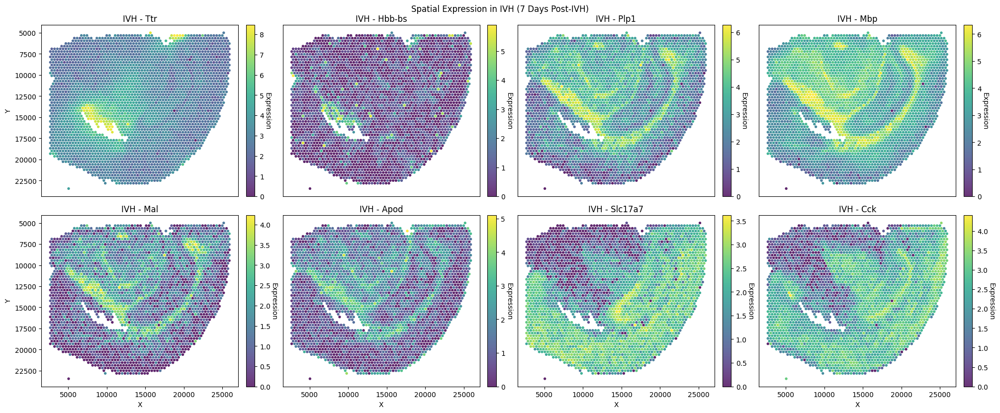

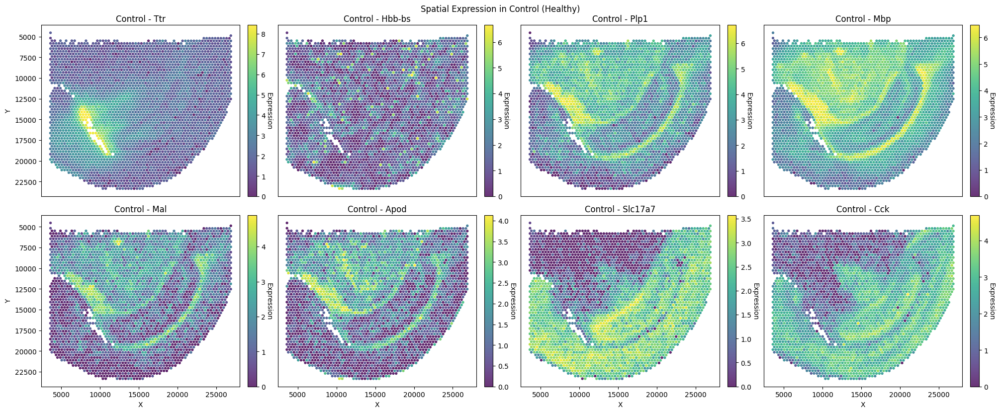

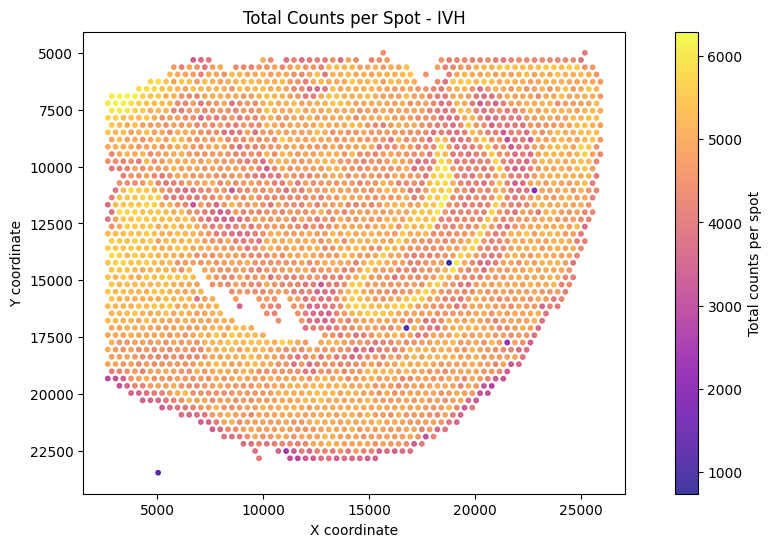

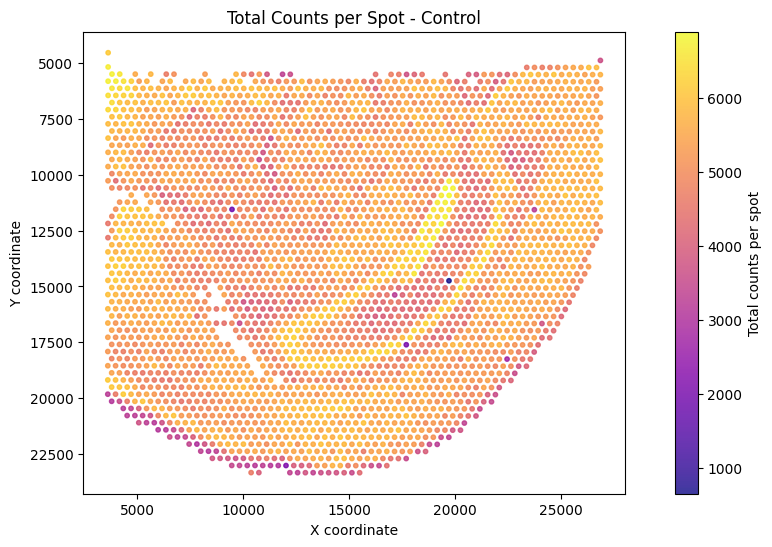

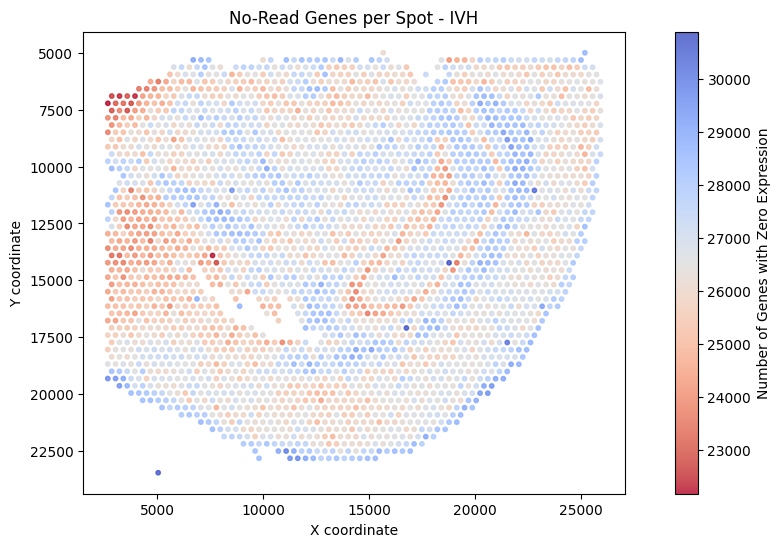

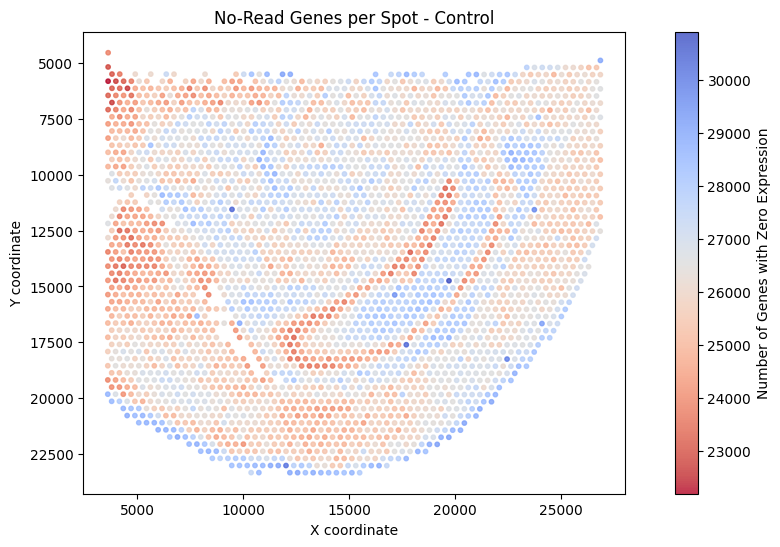

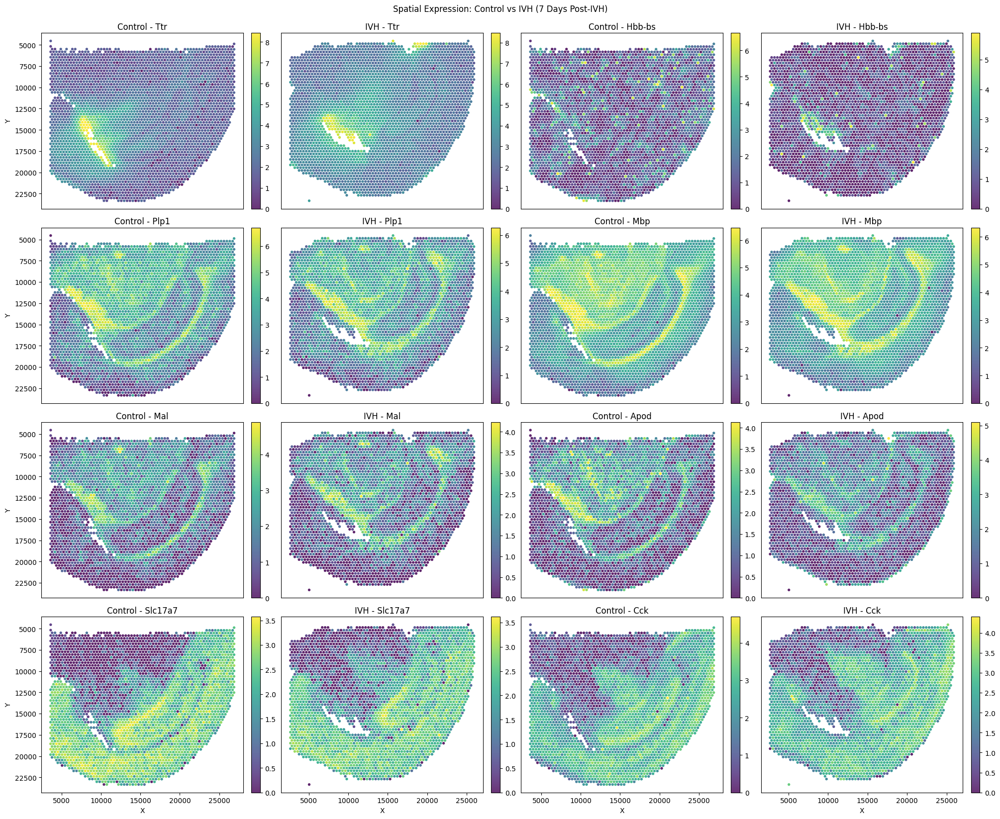

In [ ]:
# === IVH Spatial Gene Expression ===
fig, axs = plt.subplots(2, 4, figsize=(20, 8), constrained_layout=True)
fig.suptitle('Spatial Expression in IVH (7 Days Post-IVH)', y=1.02)
axs = axs.ravel()

for i, gene in enumerate(focus_genes):
    if gene not in adata_ivh.var_names:
        print(f"Skipping {gene} (IVH): not found in dataset.")
        continue

    gene_idx = adata_ivh.var_names.get_loc(gene)
    expr = adata_ivh.X[:, gene_idx].toarray().flatten() if not isinstance(adata_ivh.X, np.ndarray) else adata_ivh.X[:, gene_idx]

    sc_plot = axs[i].scatter(coords_ivh[:, 0], coords_ivh[:, 1], c=expr, cmap='viridis', s=8, alpha=0.8)
    axs[i].set_title(f"IVH - {gene}", pad=5)
    axs[i].invert_yaxis()

    cbar = fig.colorbar(sc_plot, ax=axs[i], fraction=0.046, pad=0.04)
    cbar.set_label('Expression', rotation=270, labelpad=10)

    row, col = divmod(i, 4)
    if row == 1:
        axs[i].set_xlabel("X")
    else:
        axs[i].set_xticks([])
        axs[i].set_xticklabels([])
    if col == 0:
        axs[i].set_ylabel("Y")
    else:
        axs[i].set_yticks([])
        axs[i].set_yticklabels([])

plt.savefig('/content/drive/MyDrive/Colab Notebooks/ivh_top_genes_grid.png', dpi=300, bbox_inches='tight')
plt.show()

# === Control Spatial Gene Expression ===
fig, axs = plt.subplots(2, 4, figsize=(20, 8), constrained_layout=True)
fig.suptitle('Spatial Expression in Control (Healthy)', y=1.02)
axs = axs.ravel()

for i, gene in enumerate(focus_genes):
    if gene not in adata_ctrl.var_names:
        print(f"Skipping {gene} (Control): not found in dataset.")
        continue

    gene_idx = adata_ctrl.var_names.get_loc(gene)
    expr = adata_ctrl.X[:, gene_idx].toarray().flatten() if not isinstance(adata_ctrl.X, np.ndarray) else adata_ctrl.X[:, gene_idx]

    sc_plot = axs[i].scatter(coords_ctrl[:, 0], coords_ctrl[:, 1], c=expr, cmap='viridis', s=8, alpha=0.8)
    axs[i].set_title(f"Control - {gene}", pad=5)
    axs[i].invert_yaxis()

    cbar = fig.colorbar(sc_plot, ax=axs[i], fraction=0.046, pad=0.04)
    cbar.set_label('Expression', rotation=270, labelpad=10)

    row, col = divmod(i, 4)
    if row == 1:
        axs[i].set_xlabel("X")
    else:
        axs[i].set_xticks([])
        axs[i].set_xticklabels([])
    if col == 0:
        axs[i].set_ylabel("Y")
    else:
        axs[i].set_yticks([])
        axs[i].set_yticklabels([])

plt.savefig('/content/drive/MyDrive/Colab Notebooks/control_top_genes_grid.png', dpi=300, bbox_inches='tight')
plt.show()

# === Total Counts Plot ===
for adata, coords, label in [
    (adata_ivh, coords_ivh, "IVH"),
    (adata_ctrl, coords_ctrl, "Control")
]:
    total_counts = adata.X.sum(axis=1).A1 if not isinstance(adata.X, np.ndarray) else adata.X.sum(axis=1)
    plt.figure(figsize=(8, 6))
    sc_total = plt.scatter(coords[:, 0], coords[:, 1], c=total_counts,
                           cmap='plasma', s=10, alpha=0.8)
    plt.colorbar(sc_total, label='Total counts per spot', fraction=0.046, pad=0.08)
    plt.title(f'Total Counts per Spot - {label}')
    plt.gca().invert_yaxis()
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.savefig(f'/content/drive/MyDrive/Colab Notebooks/{label.lower()}_total_counts.png', dpi=300, bbox_inches='tight')
    plt.show()

# === No Reads per Spot ===
for adata, coords, label in [
    (adata_ivh, coords_ivh, "IVH"),
    (adata_ctrl, coords_ctrl, "Control")
]:
    expr_matrix = adata.X.toarray() if not isinstance(adata.X, np.ndarray) else adata.X
    no_reads = np.sum(expr_matrix == 0, axis=1)

    plt.figure(figsize=(8, 6))
    sc_zero = plt.scatter(coords[:, 0], coords[:, 1], c=no_reads,
                          cmap='coolwarm_r', s=10, alpha=0.8)
    plt.colorbar(sc_zero, label='Number of Genes with Zero Expression', fraction=0.046, pad=0.08)
    plt.title(f'No-Read Genes per Spot - {label}')
    plt.gca().invert_yaxis()
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.savefig(f'/content/drive/MyDrive/Colab Notebooks/{label.lower()}_no_reads.png', dpi=300, bbox_inches='tight')
    plt.show()

# === All 8 Genes: Control vs IVH (4 rows, 4 columns) ===
fig, axs = plt.subplots(4, 4, figsize=(20, 16), constrained_layout=True)
fig.suptitle('Spatial Expression: Control vs IVH (7 Days Post-IVH)', y=1.02)
axs = axs.ravel()  # Flatten to 1D array for easy indexing

for i, gene in enumerate(focus_genes[:8]):  # Ensure we don't exceed 8 genes
    # Calculate plot positions - 2 plots per gene (Control + IVH)
    ctrl_pos = 2*i
    ivh_pos = 2*i + 1

    # --- Control Plot ---
    if gene in adata_ctrl.var_names:
        gene_idx = adata_ctrl.var_names.get_loc(gene)
        expr = adata_ctrl.X[:, gene_idx].toarray().flatten() if not isinstance(adata_ctrl.X, np.ndarray) else adata_ctrl.X[:, gene_idx]
        sc_plot = axs[ctrl_pos].scatter(coords_ctrl[:, 0], coords_ctrl[:, 1],
                                      c=expr, cmap='viridis', s=8, alpha=0.8)
        axs[ctrl_pos].set_title(f"Control - {gene}", pad=5)
        fig.colorbar(sc_plot, ax=axs[ctrl_pos], fraction=0.046, pad=0.04)
    else:
        axs[ctrl_pos].text(0.5, 0.5, f"{gene}\nnot in Control",
                          ha='center', va='center', fontsize=9)
        axs[ctrl_pos].set_title(f"Control - {gene}", pad=5)

    # --- IVH Plot ---
    if gene in adata_ivh.var_names:
        gene_idx = adata_ivh.var_names.get_loc(gene)
        expr = adata_ivh.X[:, gene_idx].toarray().flatten() if not isinstance(adata_ivh.X, np.ndarray) else adata_ivh.X[:, gene_idx]
        sc_plot = axs[ivh_pos].scatter(coords_ivh[:, 0], coords_ivh[:, 1],
                                     c=expr, cmap='viridis', s=8, alpha=0.8)
        axs[ivh_pos].set_title(f"IVH - {gene}", pad=5)
        fig.colorbar(sc_plot, ax=axs[ivh_pos], fraction=0.046, pad=0.04)
    else:
        axs[ivh_pos].text(0.5, 0.5, f"{gene}\nnot in IVH",
                         ha='center', va='center', fontsize=9)
        axs[ivh_pos].set_title(f"IVH - {gene}", pad=5)

# Format all axes (matches your style exactly)
for i in range(16):  # 4 rows × 4 columns = 16 plots (8 genes × 2 conditions)
    if i >= len(axs):  # Safety check
        break
    axs[i].invert_yaxis()
    row, col = divmod(i, 4)
    if row == 3:  # Only show x-axis on bottom row
        axs[i].set_xlabel("X")
    else:
        axs[i].set_xticks([])
    if col == 0:  # Only show y-axis on first column
        axs[i].set_ylabel("Y")
    else:
        axs[i].set_yticks([])

plt.savefig('/content/drive/MyDrive/Colab Notebooks/control_vs_ivh_8genes_paired.png',
            dpi=300, bbox_inches='tight')
plt.show()

# **WEEK 2**
Reduces 23 cell types → 10 broader groups for clearer visualization/analysis.

In [ ]:
#Hierachical Clustering

import scanpy as sc
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt

# Load data
meta = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/meta_ct23_g5000.pkl")
data = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/data_ct23_g5000.pkl")

# Step 1: Compute average expression per original cell type
avg_exp = data.T.groupby(meta['subclass_label']).mean()  # Genes × Original cell types

# Step 2: Hierarchical clustering
Z = linkage(avg_exp, method='ward', metric='euclidean')  # Ward's method minimizes variance

# Plot dendrogram to decide cluster cutoff
plt.figure(figsize=(10, 5))
dendrogram(Z, labels=avg_exp.index)
plt.title("Cell-Type Hierarchical Clustering")
plt.axhline(y=15, color='r', linestyle='--')  # Adjust cutoff line as needed
plt.show()

# Step 3: Cut tree to get clusters (adjust `t` based on dendrogram)
n_clusters = 10  # Target number of groups
cluster_labels = fcluster(Z, t=n_clusters, criterion='maxclust')

# Map original cell types to new clusters
grouping = {ct: f"Cluster_{label}" for ct, label in zip(avg_exp.index, cluster_labels)}

# Step 4: Apply new labels
group_labels = [grouping[ct] for ct in meta['subclass_label']]
data.columns = group_labels  # Assign new labels to data

# Define human-readable names for clusters
cluster_rename_dict = {
    "Cluster_1": "Cortical Layer 2/3 Intratelencephalic IT Neurons",
    "Cluster_2": "Hippocampal Excitatory Neurons & Astrocytes",
    "Cluster_3": "Cortical Layer 6 IT-CT Neurons",
    "Cluster_4": "Cortical Layer 5 Pyramidal Tract PT Neurons",
    "Cluster_5": "Cortical Layer 5/6 IT Neurons",
    "Cluster_6": "Entorhinal Cortex IT Neurons",
    "Cluster_7": "SST-VIP-Lamp5 Interneurons",
    "Cluster_8": "SST-Sncg Interneurons",
    "Cluster_9": "Parvalbumin Interneurons",
    "Cluster_10": "Oligodendrocytes"
}

# Convert to labels
readable_labels = np.array([cluster_rename_dict[clust] for clust in group_labels])

# Save
np.save("/content/drive/MyDrive/Colab Notebooks/clustered_labels.npy", readable_labels)

print("Cluster labels saved to clustered_labels.npy")


First 10 group labels:
['Cluster_1', 'Cluster_6', 'Cluster_7', 'Cluster_1', 'Cluster_3', 'Cluster_1', 'Cluster_9', 'Cluster_6', 'Cluster_7', 'Cluster_4']

Unique cluster labels:
['Cluster_1' 'Cluster_10' 'Cluster_2' 'Cluster_3' 'Cluster_4' 'Cluster_5'
 'Cluster_6' 'Cluster_7' 'Cluster_8' 'Cluster_9']
New data columns (cluster labels):
['Cluster_1', 'Cluster_6', 'Cluster_7', 'Cluster_1', 'Cluster_3', 'Cluster_1', 'Cluster_9', 'Cluster_6', 'Cluster_7', 'Cluster_4']

Total number of cells per cluster:
Cluster_1     25000
Cluster_6     25000
Cluster_7     10000
Cluster_3     10000
Cluster_4     10000
Cluster_8     10000
Cluster_2     10000
Cluster_9      5000
Cluster_10     5000
Cluster_5      5000
Name: count, dtype: int64

Original cell types to new clusters:


,Original_CellType,New_Cluster
0,CA1-ProS,Cluster_2
1,CT SUB,Cluster_6
2,Car3,Cluster_2
3,DG,Cluster_6
4,L2/3 IT CTX,Cluster_1
5,L2/3 IT ENTl,Cluster_1
6,L2/3 IT PPP,Cluster_6
7,L3 IT ENT,Cluster_1
8,L4/5 IT CTX,Cluster_1
9,L5 IT CTX,Cluster_4


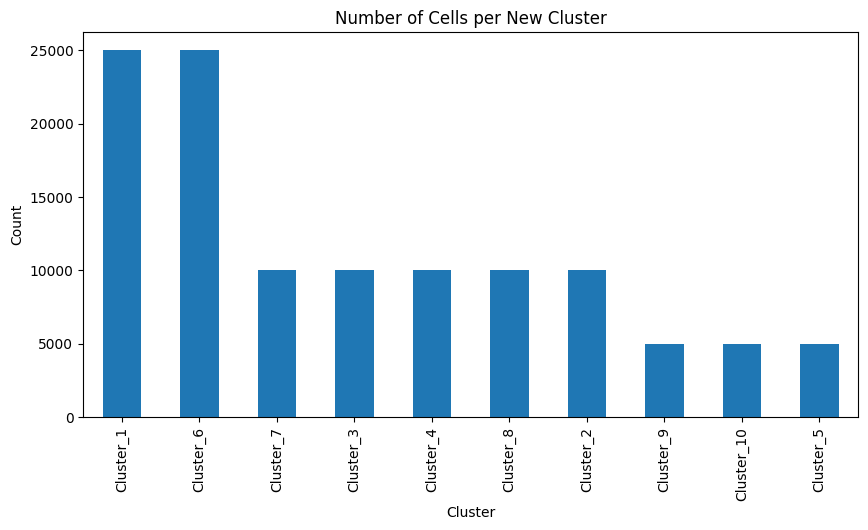

In [ ]:
# Print the first few labels
print("First 10 group labels:")
print(group_labels[:10])

# Print all unique cluster labels
print("\nUnique cluster labels:")
print(np.unique(group_labels))

# Show the new column names (cluster labels) of the data DataFrame
print("New data columns (cluster labels):")
print(data.columns.tolist()[:10])  # First 10 labels
print("\nTotal number of cells per cluster:")
print(data.columns.value_counts())

# Create a mapping DataFrame for clarity
cluster_mapping = pd.DataFrame({
    'Original_CellType': avg_exp.index,
    'New_Cluster': [grouping[ct] for ct in avg_exp.index]
})

# Display the mapping
print("\nOriginal cell types to new clusters:")
display(cluster_mapping)  # 'display' works in Jupyter, or use 'print(cluster_mapping)'

# Plot the distribution of cells in each new cluster
plt.figure(figsize=(10, 5))
pd.Series(group_labels).value_counts().plot(kind='bar')
plt.title("Number of Cells per New Cluster")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.show()

In [ ]:
#Creating dictionary
meta = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/meta_ct23_g5000.pkl")
cell_types = meta['subclass_label']

data= pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/data_ct23_g5000.pkl")

data.columns = cell_types.values

cts = np.unique(cell_types.values)

group_names = ['Hippocampal Excitatory Neurons' , 'Cortical Layer 2/3 Intratelencephalic (IT) Neurons' ,'Cortical Layer 4/5 IT Neurons' , 'Cortical Layer 5 Pyramidal Tract (PT) Neurons' , 'Cortical Layer 5/6 IT Neurons' , 'Cortical Layer 6 IT/CT Neurons' , 'Entorhinal Cortex IT Neurons' , 'Parvalbumin-Interneurons' , 'SST/VIP/Lamp5 Interneurons' , 'Non-neuronal Cells']
len(group_names)

ct2group_id = [
    0,  # 'CA1-ProS' -> Hippocampal Excitatory Neurons
    0,  # 'CT SUB' -> Hippocampal Excitatory Neurons
    9,  # 'Car3' -> Non-neuronal Cells
    0,  # 'DG' -> Hippocampal Excitatory Neurons
    1,  # 'L2/3 IT CTX' -> Cortical Layer 2/3 Intratelencephalic (IT) Neurons
    1,  # 'L2/3 IT ENTl' -> Cortical Layer 2/3 Intratelencephalic (IT) Neurons
    1,  # 'L2/3 IT PPP' -> Cortical Layer 2/3 Intratelencephalic (IT) Neurons
    6,  # 'L3 IT ENT' -> Entorhinal Cortex IT Neurons
    2,  # 'L4/5 IT CTX' -> Cortical Layer 4/5 IT Neurons
    2,  # 'L5 IT CTX' -> Cortical Layer 4/5 IT Neurons
    3,  # 'L5 PT CTX' -> Cortical Layer 5 Pyramidal Tract (PT) Neurons
    4,  # 'L5/6 IT TPE-ENT' -> Cortical Layer 5/6 IT Neurons
    4,  # 'L5/6 NP CTX' -> Cortical Layer 5/6 IT Neurons
    5,  # 'L6 CT CTX' -> Cortical Layer 6 IT/CT Neurons
    5,  # 'L6 IT CTX' -> Cortical Layer 6 IT/CT Neurons
    5,  # 'L6b CTX' -> Cortical Layer 6 IT/CT Neurons
    5,  # 'L6b/CT ENT' -> Cortical Layer 6 IT/CT Neurons
    8,  # 'Lamp5' -> SST/VIP/Lamp5 Interneurons
    9,  # 'Oligo' -> Non-neuronal Cells
    7,  # 'Pvalb' -> Parvalbumin-Interneurons
    8,  # 'Sncg' -> SST/VIP/Lamp5 Interneurons
    8,  # 'Sst' -> SST/VIP/Lamp5 Interneurons
    8   # 'Vip' -> SST/VIP/Lamp5 Interneurons
]

grouping = {}
for i in range(0,len(cts)):
  ct = cts[i]
  grouping[ct] = group_names[ct2group_id[i]]

ct_labels = meta['subclass_label'].values

group_labels = []
for ct in ct_labels:
  group_labels.append(grouping[ct])

data.columns = group_labels

np.save("/content/drive/MyDrive/Colab Notebooks/grouped_labels.npy" , np.array(group_labels))

**Deconomix: Task 2 Week 2**

In [ ]:
#---------------------------------------------------------WEEK 2----------------------------------------------------------------------#
#Step1 Import Data: Reference Data
train_5000 = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/data_ct23_g5000.pkl")
group_labels = np.load("/content/drive/MyDrive/Colab Notebooks/clustered_labels.npy")
train_5000.columns = group_labels
train_5000

,Cortical Layer 2/3 Intratelencephalic IT Neurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Cortical Layer 6 IT-CT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Parvalbumin Interneurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,...,Cortical Layer 5/6 IT Neurons,Cortical Layer 5/6 IT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Oligodendrocytes,Cortical Layer 5/6 IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,SST-VIP-Lamp5 Interneurons,SST-Sncg Interneurons
Xkr4,8,0,30,17,16,1,14,1,14,18,...,11,20,21,0,14,5,10,7,1,16
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mid2,0,0,0,0,0,0,0,0,1,2,...,0,1,0,0,0,0,0,0,0,0
Eif2c5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tex13b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Vsig1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Step1: View the main expression matrix (X) of ST data in dataframe
adata_healthy = adata_ctrl.to_df().T  # This converts the matrix to a pandas DataFrame .T switched the X & Y axis
adata_healthy

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,AAACCGTTCGTCCAGG-1,AAACCTCATGAAGTTG-1,AAACGAGACGGTTGAT-1,...,TTGTGGTATAGGTATG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1
Xkr4,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
Gm1992,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
Gm37381,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
Rp1,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
Sox17,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000
AC149090.1,0.6918,0.907496,1.201551,0.93332,0.994609,0.952523,0.000000,0.00000,1.009399,0.515976,...,0.000000,0.449222,0.707804,0.0,0.865557,0.904599,0.824494,0.94173,0.82329,0.000000
CAAA01118383.1,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.434809,0.60417,0.000000,0.000000,...,0.644871,0.449222,0.000000,0.0,1.322465,0.000000,0.000000,0.00000,0.00000,0.510936
Vmn2r122,0.0000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000


In [ ]:
# Step1: View the main expression matrix (X) of ST data in dataframe
adata_ST = adata_ivh.to_df().T  # This converts the matrix to a pandas DataFrame .T switched the X & Y axis
adata_ST

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACCGTTCGTCCAGG-1,AAACCTCATGAAGTTG-1,AAACGAGACGGTTGAT-1,AAACGTGTTCGCCCTA-1,AAACTCGTGATATAAG-1,...,TTGTGGTATAGGTATG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1
Xkr4,0.000000,0.000000,0.0,0.000000,0.606236,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.884526,0.000000,0.000000,0.000000,0.000000,0.000000
Gm1992,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Gm37381,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Rp1,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Sox17,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.884526,0.000000,0.779819,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AC149090.1,0.845332,1.397084,0.0,0.813356,0.000000,1.264128,1.350137,0.989019,0.485923,1.423751,...,0.988773,1.352693,0.0,0.0,0.000000,1.243486,0.000000,0.982351,1.041372,1.705753
CAAA01118383.1,0.000000,0.000000,0.0,0.000000,0.606236,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.607243,0.000000,0.000000
Vmn2r122,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
#Step 1 HEALTHY TEST Data: Index
genes_healthy = adata_ctrl.to_df().T.index
genes_healthy

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'AC149090.1', 'CAAA01118383.1', 'Vmn2r122',
       'CAAA01147332.1'],
      dtype='object', length=31053)

In [ ]:
#Step 1 TEST Data: Index
genes_st = adata_ivh.to_df().T.index
genes_st

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'AC149090.1', 'CAAA01118383.1', 'Vmn2r122',
       'CAAA01147332.1'],
      dtype='object', length=31053)

In [ ]:
# Train set: iloc to 3000 Rows, Output: Xkr4 to Gm13942
train = train_5000.iloc[:3000]  # For testing
train

,Cortical Layer 2/3 Intratelencephalic IT Neurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Cortical Layer 6 IT-CT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Parvalbumin Interneurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,...,Cortical Layer 5/6 IT Neurons,Cortical Layer 5/6 IT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Oligodendrocytes,Cortical Layer 5/6 IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,SST-VIP-Lamp5 Interneurons,SST-Sncg Interneurons
Xkr4,8,0,30,17,16,1,14,1,14,18,...,11,20,21,0,14,5,10,7,1,16
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fibin,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Slc5a12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ano3,4,4,0,9,10,1,0,4,1,16,...,0,14,1,0,11,0,0,0,0,0
Muc15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Step 2 Intersect HEALTHY Data: Index both Reference & Spatial Transcriptomic Data & Intersect it
genes_train_healthy = train.index
genes_healthy = adata_ctrl.var_names
common_genes_healthy = genes_train_healthy.intersection(genes_healthy)
common_genes_healthy

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'Lgr4', 'Ccdc34', 'Ccdc34os', 'Gm13936', 'Bbox1', 'Fibin', 'Slc5a12',
       'Ano3', 'Muc15', 'Gm13942'],
      dtype='object', length=2995)

In [ ]:
#Step 2 Intersect Data: Index both Reference & Spatial Transcriptomic Data & Intersect it
genes_train = train.index
genes_st = adata_ivh.var_names
common_genes = genes_train.intersection(genes_st)
common_genes

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'Lgr4', 'Ccdc34', 'Ccdc34os', 'Gm13936', 'Bbox1', 'Fibin', 'Slc5a12',
       'Ano3', 'Muc15', 'Gm13942'],
      dtype='object', length=2995)

In [ ]:
#Step 2 Intersect Data: Update train after intersection
#train = train.loc[common_genes,:]
#train

#OR

train = train.loc[common_genes_healthy,:]
train

,Cortical Layer 2/3 Intratelencephalic IT Neurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Cortical Layer 6 IT-CT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Parvalbumin Interneurons,Entorhinal Cortex IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,...,Cortical Layer 5/6 IT Neurons,Cortical Layer 5/6 IT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,Oligodendrocytes,Cortical Layer 5/6 IT Neurons,SST-VIP-Lamp5 Interneurons,Cortical Layer 5 Pyramidal Tract PT Neurons,Cortical Layer 2/3 Intratelencephalic IT Neurons,SST-VIP-Lamp5 Interneurons,SST-Sncg Interneurons
Xkr4,8,0,30,17,16,1,14,1,14,18,...,11,20,21,0,14,5,10,7,1,16
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fibin,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Slc5a12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ano3,4,4,0,9,10,1,0,4,1,16,...,0,14,1,0,11,0,0,0,0,0
Muc15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Y_test = adata_ST.loc[common_genes,:] #change with adata_ctrl or adata_ST
#Y_test

#OR

Y_test = adata_healthy.loc[common_genes_healthy,:] #change with adata_ctrl or adata_ST
Y_test

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,AAACCGTTCGTCCAGG-1,AAACCTCATGAAGTTG-1,AAACGAGACGGTTGAT-1,...,TTGTGGTATAGGTATG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1
Xkr4,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
Gm1992,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
Gm37381,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
Rp1,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
Sox17,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fibin,0.0,0.0,0.771327,0.0,0.000000,0.0,0.000000,0.0,0.0,0.515976,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.824494,0.000000,0.00000,0.0
Slc5a12,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0
Ano3,0.0,0.0,0.000000,0.0,0.616176,0.0,0.736846,0.0,0.0,1.308627,...,0.0,0.993725,1.118107,0.0,0.0,0.0,0.824494,0.577853,0.82329,0.0
Muc15,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0


In [ ]:
#Step1 Reference Data
# Deconvolution - pseudobulk - artificial
X_ref, Y_mat, C_mat = deconomix.utils.simulate_data(train, n_mixtures = 1000, n_cells_in_mix = 100)
display(X_ref) # Average gene expression per cell type
display(Y_mat) # Artificial bulk mixtures
display(C_mat) # All possible cell mixes your cell might see

In [ ]:
#Step1 Reference Data
# Deconvolution: Train the gene weignt vector gamma
model0 = deconomix.methods.DTD(X_ref, Y_mat, C_mat)
model0.run(iterations = 300)

i = 300, loss = -8.080969e+00: 100%|██████████| 300/300 [00:50<00:00,  5.95it/s]


In [ ]:
#Step1 Reference Data
# Deconvolution: Resulting gene weights in gamma model
model0.gamma

,gene weights
Xkr4,1.719124e-03
Gm1992,2.456457e-13
Gm37381,5.291146e-17
Rp1,5.440652e+00
Sox17,1.370817e-10
...,...
Fibin,1.748654e+00
Slc5a12,3.037895e+00
Ano3,4.424608e-02
Muc15,3.367467e+00


In [ ]:
#Step1 Reference Data: Sanity Check
# Deconvolution: Estimate composition of cell tye in training (C_est) vs true composition (C_mat)
C_est_train = deconomix.utils.calculate_estimated_composition(X_ref, Y_mat, model0.gamma)
display(C_est_train)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
Cortical Layer 2/3 Intratelencephalic IT Neurons,0.252296,0.148642,0.267789,0.179583,0.284593,0.271362,0.212817,0.215646,0.169227,0.069682,...,0.289562,0.286248,0.234477,0.160188,0.216627,0.161605,0.249550,0.156113,0.218662,0.242402
Cortical Layer 5 Pyramidal Tract PT Neurons,0.254988,0.137334,0.118305,0.126530,0.037502,0.110610,0.097683,0.066919,0.040846,0.097231,...,0.047196,0.074407,0.134967,0.146847,0.070464,0.064680,0.049402,0.075473,0.101024,0.066774
Cortical Layer 5/6 IT Neurons,0.043404,0.025003,0.041281,0.024964,0.044953,0.000000,0.035794,0.084009,0.059476,0.005249,...,0.066035,0.038140,0.067336,0.032116,0.042129,0.048592,0.021047,0.064207,0.021335,0.028092
Cortical Layer 6 IT-CT Neurons,0.076027,0.096643,0.092709,0.154873,0.127216,0.098703,0.126641,0.019973,0.089443,0.079719,...,0.027432,0.080659,0.058559,0.090171,0.106524,0.034405,0.087769,0.067397,0.042362,0.019325
Entorhinal Cortex IT Neurons,0.154122,0.189630,0.143366,0.189677,0.246764,0.153716,0.209933,0.262308,0.198772,0.343042,...,0.156479,0.147387,0.129445,0.209161,0.141101,0.248118,0.188647,0.234946,0.219459,0.275880
Hippocampal Excitatory Neurons & Astrocytes,0.063855,0.110237,0.076918,0.089573,0.140447,0.128770,0.069547,0.160735,0.058571,0.093178,...,0.150159,0.067544,0.042827,0.040775,0.109830,0.137398,0.132129,0.108683,0.071853,0.119242
Oligodendrocytes,0.025443,0.013254,0.093301,0.002095,0.033108,0.024861,0.032574,0.000000,0.079804,0.025345,...,0.010814,0.057503,0.047552,0.032280,0.039995,0.032623,0.000000,0.081399,0.042114,0.039143
Parvalbumin Interneurons,0.003706,0.054446,0.022422,0.040683,0.014155,0.006447,0.042028,0.024572,0.028102,0.019092,...,0.049430,0.047474,0.015228,0.040858,0.053192,0.063528,0.048960,0.018265,0.039781,0.053931
SST-Sncg Interneurons,0.123648,0.174757,0.054040,0.103488,0.106051,0.094334,0.110153,0.049624,0.068238,0.159460,...,0.151538,0.102527,0.129154,0.122337,0.121859,0.176249,0.118962,0.051939,0.082853,0.049167
SST-VIP-Lamp5 Interneurons,0.000000,0.119576,0.097000,0.067482,0.069507,0.075038,0.051812,0.099241,0.174070,0.112335,...,0.051522,0.103615,0.152050,0.136178,0.117444,0.086367,0.109790,0.117475,0.120600,0.106120


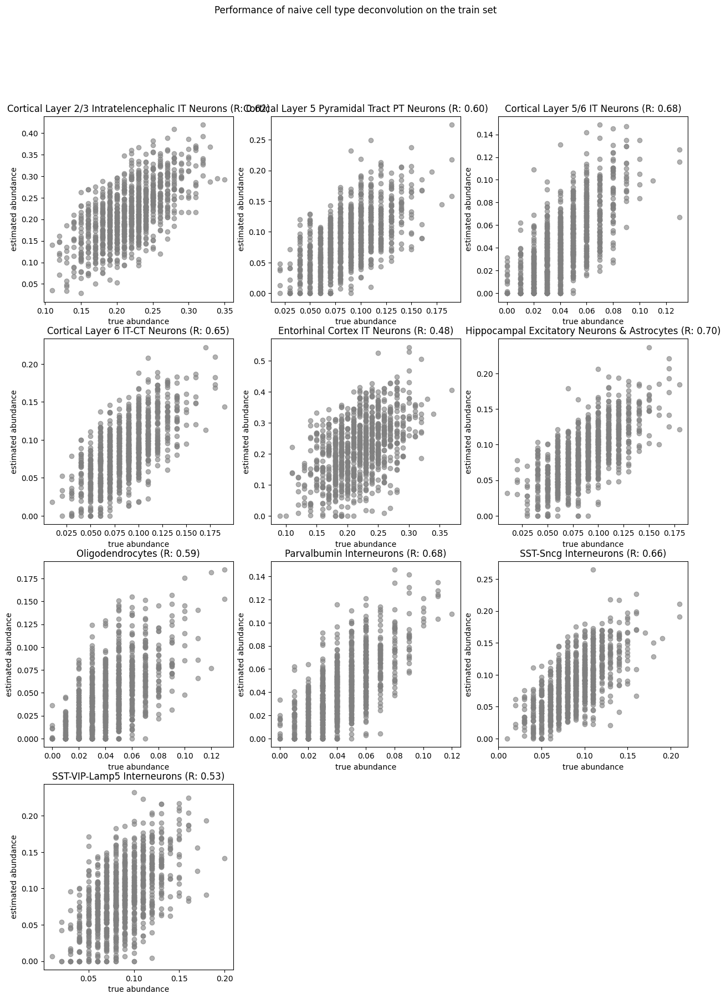

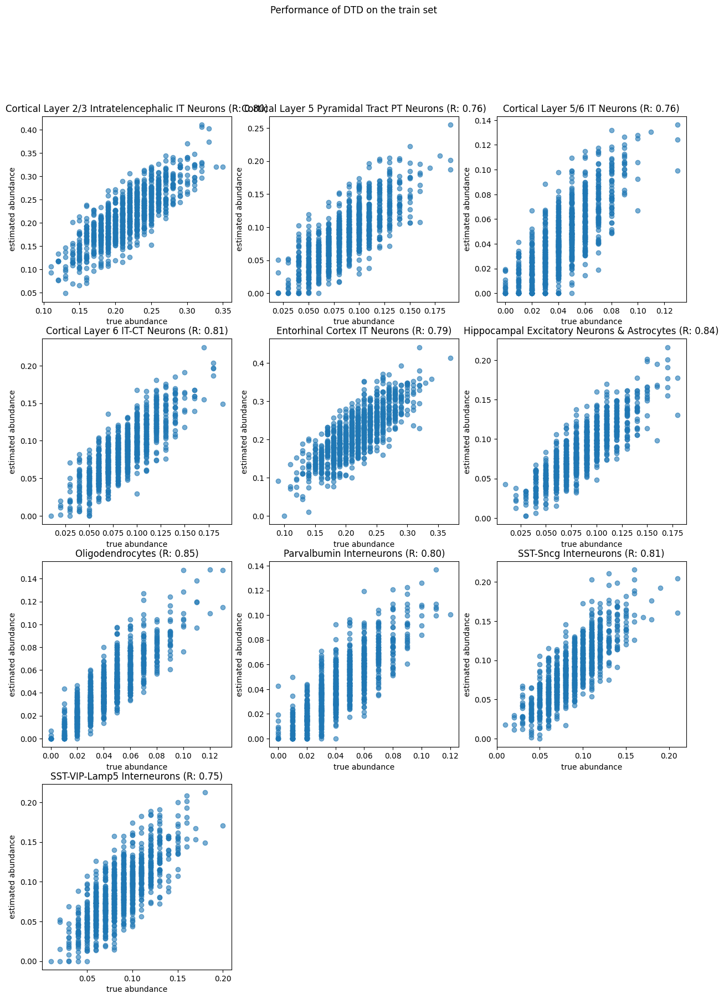

In [ ]:
#VALIDATION
#Naive cell type deconvolution would perform, without learned gene weights
gamma_naive = pd.Series(np.ones((2995)))
gamma_naive.index = model0.gamma.index
C_est_train_naive = deconomix.utils.calculate_estimated_composition(X_ref, Y_mat, gamma_naive)
corr_train_naive = deconomix.utils.plot_corr(C_mat, C_est_train_naive, title="Performance of naive cell type deconvolution on the train set")
corr_train = deconomix.utils.plot_corr(C_mat, C_est_train, title="Performance of DTD on the train set", color="C0")

## All 6 celltypes show high correlation coefficients to our ground truth and have improved in comparison to the naive solution. Especially lower abundant cells like the NK cells were estimated significantly better (0.90 vs 0.61). This is expected on our training set. Let's try the same analysis for the test set, with our trained gamma and the same reference matrix, to see how well the model generalizes.

In [ ]:
#X_test , Y_test, C_test = deconomix.utils.simulate_data(contol or healthy, n_mixtures = 1000, n_cells_in_mix = 100)
C_est_test = deconomix.utils.calculate_estimated_composition(X_ref, Y_test, model0.gamma)
C_est_test

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,AAACCGTTCGTCCAGG-1,AAACCTCATGAAGTTG-1,AAACGAGACGGTTGAT-1,...,TTGTGGTATAGGTATG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1
Cortical Layer 2/3 Intratelencephalic IT Neurons,0.266938,0.277819,0.217056,0.249191,0.170115,0.623383,0.155051,0.483913,0.276762,0.084368,...,0.563890,0.148802,0.163549,0.037098,0.201647,0.000000,0.118426,0.000000,0.495709,0.206286
Cortical Layer 5 Pyramidal Tract PT Neurons,0.217327,0.000000,0.044213,0.000000,0.026582,0.000000,0.111071,0.000000,0.000000,0.057334,...,0.000000,0.036542,0.000000,0.117483,0.000000,0.149734,0.046579,0.077908,0.000000,0.022909
Cortical Layer 5/6 IT Neurons,0.000000,0.129859,0.068802,0.110498,0.055704,0.000000,0.000000,0.053404,0.034851,0.047515,...,0.032805,0.007839,0.025667,0.056285,0.063625,0.118253,0.122697,0.163683,0.039719,0.119003
Cortical Layer 6 IT-CT Neurons,0.000000,0.000000,0.000000,0.021717,0.077984,0.071757,0.000000,0.029338,0.020201,0.000000,...,0.060687,0.175494,0.120749,0.054063,0.000000,0.000000,0.039106,0.000000,0.072313,0.009315
Entorhinal Cortex IT Neurons,0.000000,0.015784,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.028761,0.000000,0.000000
Hippocampal Excitatory Neurons & Astrocytes,0.062917,0.000000,0.000000,0.067554,0.073480,0.000000,0.040991,0.001213,0.179919,0.163298,...,0.070948,0.099564,0.145096,0.052741,0.000000,0.053183,0.038025,0.080086,0.027138,0.062052
Oligodendrocytes,0.482085,0.573290,0.835259,0.533145,0.721872,0.722244,0.606812,0.840183,0.779808,0.464820,...,0.515697,0.381358,0.594915,0.906344,0.945185,0.749227,1.051113,0.462687,0.437349,0.805196
Parvalbumin Interneurons,0.016083,0.000000,0.018036,0.081812,0.030823,0.076206,0.006716,0.000000,0.012969,0.086015,...,0.049536,0.054472,0.045903,0.101376,0.000000,0.062802,0.087694,0.113388,0.103601,0.042272
SST-Sncg Interneurons,0.000000,0.000000,0.032240,0.147808,0.005302,0.021120,0.028180,0.081213,0.081154,0.118368,...,0.087324,0.006765,0.138688,0.075104,0.047487,0.033292,0.000000,0.064553,0.044492,0.048155
SST-VIP-Lamp5 Interneurons,0.059995,0.047987,0.017816,0.000000,0.036468,0.039007,0.023618,0.115120,0.025308,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.066506,0.063396,0.070277,0.000000,0.000000,0.000000


In [ ]:
lamp5 = C_est_test.iloc[9,:] # [0- Column , blank - Row : all values]
lamp5

,SST-VIP-Lamp5 Interneurons
AAACAAGTATCTCCCA-1,0.059995
AAACACCAATAACTGC-1,0.047987
AAACAGAGCGACTCCT-1,0.017816
AAACAGCTTTCAGAAG-1,0.000000
AAACAGGGTCTATATT-1,0.036468
...,...
TTGTTCTAGATACGCT-1,0.063396
TTGTTGTGTGTCAAGA-1,0.070277
TTGTTTCACATCCAGG-1,0.000000
TTGTTTCATTAGTCTA-1,0.000000


# Spatial Plot Colored by a Specific Cell Type's Proportion

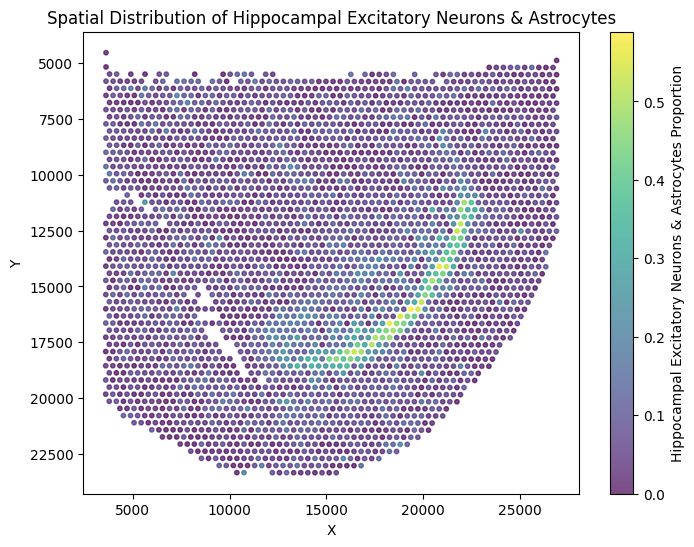

In [ ]:
# Filter out spots with zero total counts (using your existing code)
nonzero_mask = adata_ctrl.obs['total_counts'] > 0 #or adata_ivh
coords_filtered = coords_ctrl[nonzero_mask] #or coords_ivh

# Get the cell type proportions for the filtered spots
cell_type = "Hippocampal Excitatory Neurons & Astrocytes"
proportions = C_est_test.loc[cell_type][nonzero_mask]

# Plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    coords_filtered[:, 0],
    coords_filtered[:, 1],
    s=10,
    c=proportions,
    cmap="viridis",
    alpha=0.7,
)
plt.colorbar(scatter, label=f"{cell_type} Proportion")
plt.title(f"Spatial Distribution of {cell_type}")
plt.gca().invert_yaxis()  # Visium slide orientation
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

# Spatial Plot Colored by Total Cell Type Content

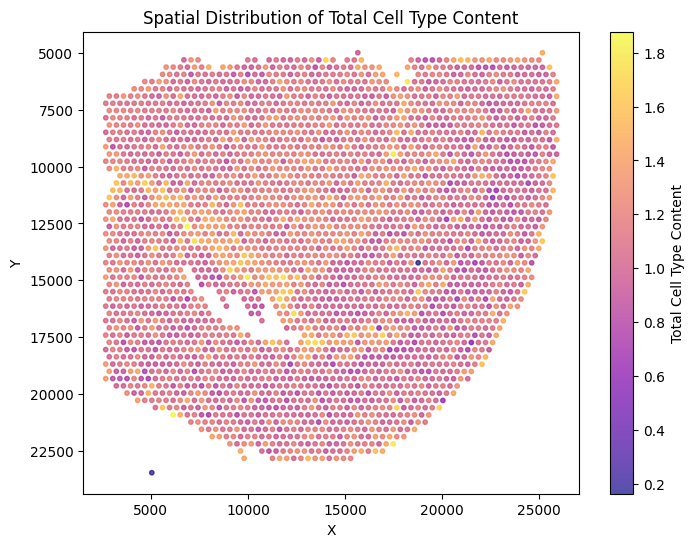

In [ ]:
total_content = C_est_test.sum(axis=0)[nonzero_mask]  # Sum across cell types

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    coords_filtered[:, 0],
    coords_filtered[:, 1],
    s=10,
    c=total_content,
    cmap="plasma",
    alpha=0.7,
)
plt.colorbar(scatter, label="Total Cell Type Content")
plt.title("Spatial Distribution of Total Cell Type Content")
plt.gca().invert_yaxis()
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

# Plot All Cell Types (Faceted Grid)

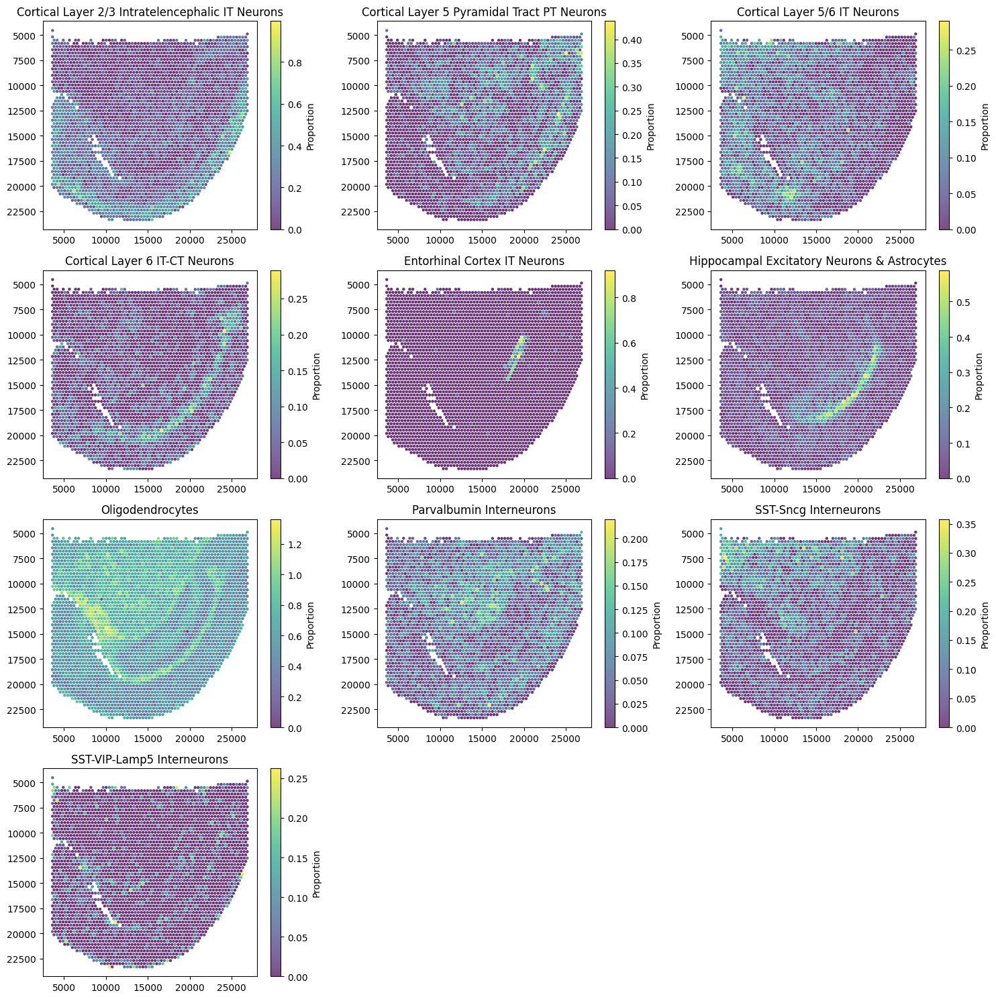

In [ ]:
import seaborn as sns

# Prepare data (melt for seaborn)
cell_types = C_est_test.index
n_cols = 3  # Number of columns in the grid
n_rows = (len(cell_types) // n_cols) + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.ravel()

for i, ct in enumerate(cell_types):
    ax = axes[i]
    proportions = C_est_test.loc[ct][nonzero_mask]
    scatter = ax.scatter(
        coords_filtered[:, 0],
        coords_filtered[:, 1],
        s=5,
        c=proportions,
        cmap="viridis",
        alpha=0.7,
    )
    ax.set_title(ct)
    ax.invert_yaxis()
    plt.colorbar(scatter, ax=ax, label="Proportion")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
cell_types = C_est_test.index
n_spots = len(coords_filtered)

# Create figure
fig, ax = plt.subplots(figsize=(15, 15))

# Get top cell types for each spot (adjust k=3 to show top N types per spot)
top_celltypes = C_est_test.T.apply(lambda x: x.nlargest(3).index.tolist(), axis=1)
top_proportions = C_est_test.T.apply(lambda x: x.nlargest(3).tolist(), axis=1)

# Plot pie charts at each spatial coordinate
for i in range(n_spots):
    if i % 10 == 0:  # Plot every 10th spot for clarity (adjust as needed)
        wedges, texts = ax.pie(
            top_proportions[i],
            center=coords_filtered[i],
            radius=50,  # Adjust size
            colors=sns.color_palette("husl", len(top_celltypes[i])),
            startangle=90
        )

# Add legend
ax.legend(
    top_celltypes.iloc[0],  # Use first spot's top types as representative
    bbox_to_anchor=(1.05, 1),
    loc='upper left'
)

ax.set_title("Spatial Distribution of Top 3 Cell Types per Spot")
ax.invert_yaxis()  # Match spatial coordinates orientation
plt.tight_layout()
plt.show()

NameError: name 'C_est_test' is not defined